In [1]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# # You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
# =========================
# Ablation Configuration
# =========================

ABLATIONS = {
    "A0_baseline": dict(edge=False, osl=False, gal=False),
    "A1_edge":     dict(edge=True,  osl=False, gal=False),
    "A2_edge_osl": dict(edge=True,  osl=True,  gal=False),
    "A3_full":     dict(edge=True,  osl=True,  gal=True),
}

print(" Ablation configs loaded")


 Ablation configs loaded


In [3]:
import os, glob
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from PIL import Image

DATA_ROOT = "/kaggle/input/whu-building-dataset/WHU"

TRAIN_IMG = os.path.join(DATA_ROOT, "train", "Image")
TRAIN_MASK = os.path.join(DATA_ROOT, "train", "Mask")
VAL_IMG   = os.path.join(DATA_ROOT, "val", "Image")
VAL_MASK  = os.path.join(DATA_ROOT, "val", "Mask")
TEST_IMG  = os.path.join(DATA_ROOT, "test", "Image")
TEST_MASK = os.path.join(DATA_ROOT, "test", "Mask")

def load_images(folder):
    exts = ["*.png","*.jpg","*.jpeg","*.tif","*.bmp"]
    paths = []
    for e in exts:
        paths += glob.glob(os.path.join(folder, e))
    return sorted(paths)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [4]:
class WHUDataset(Dataset):
    def __init__(self, image_paths, mask_paths=None, img_size=512):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.img_size = img_size

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img = Image.open(self.image_paths[idx]).convert("RGB")
        img = img.resize((self.img_size, self.img_size))
        img = torch.tensor(np.array(img) / 255.0).permute(2,0,1).float()

        if self.mask_paths:
            mask = Image.open(self.mask_paths[idx]).convert("L")
            mask = mask.resize((self.img_size, self.img_size))
            mask = torch.tensor(np.array(mask) / 255.0).unsqueeze(0).float()
            return img, mask

        return img


In [5]:
import matplotlib.pyplot as plt

def show_prediction(model, dataset, idx=None, thr=0.5):
    model.eval()
    
    if idx is None:
        idx = np.random.randint(0, len(dataset))

    img, mask = dataset[idx]
    img_t = img.unsqueeze(0).to(device)

    with torch.no_grad():
        out = model(img_t)
        logits = out[0] if isinstance(out, tuple) else out
        prob = torch.sigmoid(logits)[0,0].cpu().numpy()

    # ---- Convert to binary mask ----
    pred_bin = (prob > thr).astype(np.uint8)

    img_np = img.permute(1,2,0).numpy()
    gt_np = mask[0].numpy()

    # ---- Overlay ----
    overlay = img_np.copy()
    overlay[:,:,1] = np.maximum(overlay[:,:,1], pred_bin)
    overlay[:,:,0] *= 0.7

    plt.figure(figsize=(16,4))

    plt.subplot(1,4,1)
    plt.title("Input")
    plt.imshow(img_np)
    plt.axis("off")

    plt.subplot(1,4,2)
    plt.title("GT")
    plt.imshow(gt_np, cmap="gray")
    plt.axis("off")

    plt.subplot(1,4,3)
    plt.title("Pred (Binary)")
    plt.imshow(pred_bin, cmap="gray")
    plt.axis("off")

    plt.subplot(1,4,4)
    plt.title("Overlay")
    plt.imshow(overlay)
    plt.axis("off")

    plt.show()


In [6]:
import timm

class ViTEncoder(nn.Module):
    def __init__(self, model_name="vit_base_patch16_224", pretrained=True):
        super().__init__()
        self.model = timm.create_model(model_name, pretrained=pretrained, num_classes=0)
        self.embed_dim = self.model.embed_dim

    def forward(self, x):
        x = F.interpolate(x, (224,224), mode="bilinear", align_corners=False)
        tokens = self.model.forward_features(x)
        tokens = tokens[:,1:,:]
        B,N,C = tokens.shape
        H = W = int(N**0.5)
        return tokens.reshape(B,H,W,C).permute(0,3,1,2)


In [7]:
class EdgeBranch(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3,32,3,padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Conv2d(32,32,3,padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Conv2d(32,1,1)
        )

    def forward(self, x):
        return self.net(x)


In [8]:
class EdgeGuidedDecoder(nn.Module):
    def __init__(self, in_ch):
        super().__init__()
        self.up1 = nn.ConvTranspose2d(in_ch,128,2,2)
        self.up2 = nn.ConvTranspose2d(128,64,2,2)
        self.up3 = nn.ConvTranspose2d(64,32,2,2)
        self.out = nn.Conv2d(32,1,1)

    def forward(self, x, edge):
        x = F.relu(self.up1(x))
        x = F.relu(self.up2(x))
        x = F.relu(self.up3(x))
        edge = F.interpolate(edge, x.shape[2:], mode="bilinear", align_corners=False)
        x = x * (1 + edge)
        x = self.out(x)
        return F.interpolate(x, (512,512), mode="bilinear", align_corners=False)


In [9]:
def interior_mask(mask, band_w=5):
    """
    Returns interior region mask (far from boundaries)
    """
    band = boundary_band(mask, band_w)
    return (mask > 0.5) & (~band.bool())


In [10]:
def interior_suppression_loss(pred_logits, gt_mask):
    prob = torch.sigmoid(pred_logits)
    interior = interior_mask(gt_mask).float()
    
    # Penalize activation in interior background
    return (prob * (1 - gt_mask) * interior).mean()


In [11]:
class EdgeUNetViT(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = ViTEncoder()
        self.edge_branch = EdgeBranch()
        enc_dim = self.encoder.embed_dim
        self.decoder = EdgeGuidedDecoder(enc_dim + 1)

    def forward(self, x):
        f = self.encoder(x)
        f_mean = f.mean(1, keepdim=True)
        f_cat = torch.cat([f, f_mean], dim=1)
        edge_feat = self.edge_branch(x)
        mask = self.decoder(f_cat, edge_feat)
        return mask, edge_feat


In [12]:
class TverskyLoss(nn.Module):
    def __init__(self, alpha=0.7, beta=0.3, eps=1e-6):
        super().__init__()
        self.alpha = alpha
        self.beta = beta
        self.eps = eps

    def forward(self, logits, target):
        prob = torch.sigmoid(logits)

        tp = (prob * target).sum()
        fp = (prob * (1 - target)).sum()
        fn = ((1 - prob) * target).sum()

        tversky = (tp + self.eps) / (
            tp + self.alpha * fp + self.beta * fn + self.eps
        )
        return 1 - tversky


In [13]:
def signed_distance_loss(pred_logits, gt_mask, max_dist=20.0):
    """
    Penalize outward boundary expansion more than inward errors
    GT-only
    """
    pred = torch.sigmoid(pred_logits)

    losses = []
    for b in range(gt_mask.shape[0]):
        gt = gt_mask[b,0].cpu().numpy().astype(np.uint8)

        # Outside distance
        dist_out = cv2.distanceTransform(1 - gt, cv2.DIST_L2, 3)
        # Inside distance
        dist_in  = cv2.distanceTransform(gt, cv2.DIST_L2, 3)

        # Normalize
        dist_out = np.clip(dist_out, 0, max_dist) / max_dist
        dist_in  = np.clip(dist_in, 0, max_dist) / max_dist

        dist_out = torch.tensor(dist_out, device=pred.device).float()
        dist_in  = torch.tensor(dist_in, device=pred.device).float()

        # Penalize outward expansion more
        loss = (pred[b,0] * dist_out).mean() + \
               ((1 - pred[b,0]) * dist_in).mean()

        losses.append(loss)

    return torch.stack(losses).mean()


In [14]:
def soft_envelope(mask, margin=11):
    """
    Creates a soft envelope around GT mask.
    margin must be odd.
    """
    assert margin % 2 == 1, "margin must be odd"

    kernel = torch.ones(1, 1, margin, margin, device=mask.device)
    envelope = F.conv2d(mask, kernel, padding=margin//2)
    envelope = (envelope > 0).float()

    return envelope


def osl_style_loss(pred_logits, gt_mask, margin=11):
    """
    Overshoot Suppression Loss (OSL-style)
    Penalizes prediction outside GT envelope.
    GT-only.
    """
    prob = torch.sigmoid(pred_logits)
    env  = soft_envelope(gt_mask, margin)

    # Penalize predictions outside envelope
    return (prob * (1 - env)).mean()


In [15]:
import torch.nn.functional as F

def gal_lite_loss(pred_logits, gt_mask):
    """
    Geometry Alignment Loss (GAL-lite)
    Aligns row/column mass distributions of prediction and GT.
    GT-only.
    """
    prob = torch.sigmoid(pred_logits)

    # Row-wise projection (H)
    H_pred = prob.mean(dim=3)      # [B,1,H]
    H_gt   = gt_mask.mean(dim=3)

    # Column-wise projection (V)
    V_pred = prob.mean(dim=2)      # [B,1,W]
    V_gt   = gt_mask.mean(dim=2)

    loss_h = F.l1_loss(H_pred, H_gt)
    loss_v = F.l1_loss(V_pred, V_gt)

    return loss_h + loss_v


In [16]:
from tqdm import tqdm

In [17]:
def compute_iou(pred_logits, mask, thr=0.5, eps=1e-6):
    """
    pred_logits : [B,1,H,W] (raw output)
    mask        : [B,1,H,W] (binary GT)
    """
    prob = torch.sigmoid(pred_logits)
    pred = (prob > thr).float()

    inter = (pred * mask).sum(dim=[1,2,3])
    union = ((pred + mask) >= 1).float().sum(dim=[1,2,3])

    iou = (inter + eps) / (union + eps)
    return iou.mean().item()


In [18]:
def hard_background_mask(gt_mask, radius=15):
    """
    Confident background far from buildings
    """
    assert radius % 2 == 1
    kernel = torch.ones(1,1,radius,radius, device=gt_mask.device)
    dilated = F.conv2d(gt_mask, kernel, padding=radius//2) > 0
    return (~dilated).float()


In [38]:
def seg_loss(pred_logits, mask, edge_feat=None, edge_weight=0.2):
    """
    Unified segmentation loss.
    Works for GT-only and pseudo-label finetuning.
    """

    # --- Base losses ---
    bce = nn.BCEWithLogitsLoss()
    prob = torch.sigmoid(pred_logits)

    # Dice
    inter = (prob * mask).sum()
    union = prob.sum() + mask.sum() + 1e-6
    dice = 1 - (2 * inter / union)

    loss = 0.5 * bce(pred_logits, mask) + 0.5 * dice

    # --- Optional edge supervision ---
    if edge_feat is not None:
        gt_edge = edge_target(mask)
        loss = loss + edge_weight * bce(edge_feat, gt_edge)

    return loss


In [19]:
def hard_bg_loss(pred_logits, gt_mask):
    prob = torch.sigmoid(pred_logits)
    bg = hard_background_mask(gt_mask)
    return (prob * bg).mean()


In [20]:
def interior_loss(pred_logits, mask):
    prob = torch.sigmoid(pred_logits)
    interior = F.avg_pool2d(mask, kernel_size=7, stride=1, padding=3)
    interior = (interior > 0.9).float()
    return ((1 - prob) * interior).mean()


In [21]:
def train_segmentation(
    epochs=30,
    chunk_size=8,
    labeled_fraction=0.10,
    patience=5,
    val_every=2,          # ✅ validate every N epochs
    use_edge=True,
    use_gal=True,
    use_osl=True,
    save_name="seg_best.pth"
):
    print("🟢 Training (GT-only, edge + geometry aware)")

    # =======================
    # Loss components
    # =======================
    bce = nn.BCEWithLogitsLoss()

    class TverskyLoss(nn.Module):
        def __init__(self, alpha=0.55, beta=0.45, eps=1e-6):  # tuned for recall
            super().__init__()
            self.alpha = alpha
            self.beta = beta
            self.eps = eps

        def forward(self, logits, target):
            prob = torch.sigmoid(logits)
            tp = (prob * target).sum()
            fp = (prob * (1 - target)).sum()
            fn = ((1 - prob) * target).sum()
            tversky = (tp + self.eps) / (
                tp + self.alpha * fp + self.beta * fn + self.eps
            )
            return 1 - tversky

    tversky = TverskyLoss()

    def interior_loss(pred_logits, mask):
        prob = torch.sigmoid(pred_logits)
        interior = F.avg_pool2d(mask, 7, 1, 3)
        interior = (interior > 0.9).float()
        return ((1 - prob) * interior).mean()

    def background_suppression_loss(pred_logits, mask):
        """
        Penalize confident predictions in background regions
        """
        prob = torch.sigmoid(pred_logits)
        bg = (1 - mask)
    
        # Penalize only strong activations
        return ((prob ** 2) * bg).mean()


    def gal_loss(pred_logits, mask):
        prob = torch.sigmoid(pred_logits)
        return (
            (prob.mean(dim=3) - mask.mean(dim=3)).abs().mean() +
            (prob.mean(dim=2) - mask.mean(dim=2)).abs().mean()
        )

    # =======================
    # Dataset
    # =======================
    all_imgs = sorted(glob.glob(TRAIN_IMG + "/*.png"))
    all_masks = sorted(glob.glob(TRAIN_MASK + "/*.png"))
    k = int(len(all_imgs) * labeled_fraction)

    train_ds = WHUDataset(all_imgs[:k], all_masks[:k])
    train_loader = DataLoader(
        train_ds,
        batch_size=chunk_size,
        shuffle=True,
        num_workers=4,
        pin_memory=True,
        persistent_workers=True,
        prefetch_factor=2
    )

    val_imgs = sorted(glob.glob(VAL_IMG + "/*.png"))
    val_masks = sorted(glob.glob(VAL_MASK + "/*.png"))
    val_ds = WHUDataset(val_imgs, val_masks)
    val_loader = DataLoader(
        val_ds,
        batch_size=chunk_size,
        shuffle=False,
        num_workers=2,
        pin_memory=True
    )

    # =======================
    # Model
    # =======================
    model = EdgeUNetViT().to(device)

    if os.path.exists("vit_encoder_pretrained.pth"):
        model.encoder.load_state_dict(
            torch.load("vit_encoder_pretrained.pth", map_location=device)
        )
        print("⚡ Loaded pretrained ViT encoder")

    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4)

    best_miou = 0.0
    bad_epochs = 0

    # =======================
    # Training loop
    # =======================
    for ep in range(1, epochs + 1):
        model.train()
        total_loss = 0.0

        # geometry weight annealing (IMPORTANT)
        if ep <= int(0.5 * epochs):
            geom_w = 0.1
        else:
            geom_w = 0.0


        for img, mask in tqdm(train_loader, desc=f"Epoch {ep}/{epochs}"):
            img, mask = img.to(device), mask.to(device)

            pred, edge_feat = model(img)

            loss = 0.5 * bce(pred, mask) + 0.5 * tversky(pred, mask)
            loss += 0.1 * interior_loss(pred, mask)

            if use_edge:
                gt_edge = edge_target(mask)
                loss += 0.2 * bce(edge_feat, gt_edge)

            if use_osl:
                loss += geom_w * 0.2 * background_suppression_loss(pred, mask)


            if use_gal:
                loss += geom_w * gal_loss(pred, mask)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        print(f"🔥 Epoch {ep} | TrainLoss={total_loss/len(train_loader):.4f}")

        # =======================
        # Validation (ONLY every val_every)
        # =======================
        if ep % val_every == 0 or ep >= int(0.8 * epochs):
            model.eval()
            ious = []

            with torch.no_grad():
                for img, mask in val_loader:
                    img, mask = img.to(device), mask.to(device)
                    pred, _ = model(img)
                    ious.append(compute_iou(pred, mask))

            miou = float(np.mean(ious))
            print(f"📊 Validation mIoU = {miou:.4f}")

            # =======================
            # ✅ FIX 2: Visualize ONLY when improved
            # =======================
            if miou > best_miou:
                best_miou = miou
                bad_epochs = 0
                torch.save(model.state_dict(), save_name)
                print(f"💾 Saved best model → {save_name}")
                print("📸 Visualization (best model)")
                show_prediction(model, val_ds)
            else:
                bad_epochs += 1
                if bad_epochs >= patience:
                    print("🛑 Early stopping")
                    break

    print("🏁 GT training finished.")


In [22]:
def generate_pseudo_labels(confidence=0.85):
    model = EdgeUNetViT().to(device)
    model.load_state_dict(torch.load("seg_best.pth"))
    model.eval()

    os.makedirs("pseudo_masks", exist_ok=True)
    imgs = load_images(TEST_IMG)
    loader = DataLoader(WHUDataset(imgs), batch_size=8)

    idx=0
    with torch.no_grad():
        for x in loader:
            x=x.to(device)
            pred,_ = model(x)
            prob = torch.sigmoid(pred).cpu().numpy()
            for b in range(prob.shape[0]):
                mask=(prob[b,0]>confidence).astype(np.uint8)*255
                Image.fromarray(mask).save(f"pseudo_masks/{idx}.png")
                idx+=1


In [23]:
def finetune_with_pseudo(
    epochs=15,
    chunk_size=8,
    patience=4
):
    print(" Fine-tuning with pseudo labels (edge-safe)")

    model = EdgeUNetViT().to(device)
    model.load_state_dict(torch.load("seg_best.pth", map_location=device))
    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-5)

    # ---- REAL LABELED ----
    real_imgs  = load_images(TRAIN_IMG)
    real_masks = load_images(TRAIN_MASK)

    # ---- PSEUDO LABELED ----
    pseudo_imgs  = load_images(TEST_IMG)
    pseudo_masks = load_images("pseudo_masks")

    n_pseudo = min(len(pseudo_imgs), len(pseudo_masks))
    pseudo_imgs  = pseudo_imgs[:n_pseudo]
    pseudo_masks = pseudo_masks[:n_pseudo]

    all_imgs  = real_imgs + pseudo_imgs
    all_masks = real_masks + pseudo_masks

    print(f" Real samples   : {len(real_imgs)}")
    print(f" Pseudo samples : {len(pseudo_imgs)}")

    train_ds = WHUDataset(all_imgs, all_masks)
    train_loader = DataLoader(
        train_ds,
        batch_size=chunk_size,
        shuffle=True,
        num_workers=4,
        pin_memory=True,
        persistent_workers=True,
        prefetch_factor=2
    )


    best_loss = 1e9
    bad_epochs = 0

    for ep in range(epochs):
        model.train()
        epoch_loss = 0

        for img, mask in tqdm(train_loader, desc=f"Finetune {ep+1}/{epochs}"):
            img, mask = img.to(device), mask.to(device)

            pred, edge_feat = model(img)

            # ---- EDGE-SAFE PSEUDO HANDLING ----
            mask_safe = erode_mask(mask)

            loss = seg_loss(pred, mask_safe, edge_feat)

            # ---- SELF-CONSISTENCY (NO GT NEEDED) ----
            loss += 0.1 * consistency_loss(model, img)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()

        avg_loss = epoch_loss / len(train_loader)
        print(f" Epoch {ep+1} | Loss={avg_loss:.4f}")

        if avg_loss < best_loss:
            best_loss = avg_loss
            bad_epochs = 0
            torch.save(model.state_dict(), "seg_finetuned_best.pth")
            print(" Saved seg_finetuned_best.pth")
        else:
            bad_epochs += 1
            if bad_epochs >= patience:
                print(" Early stopping finetuning")
                break

    print(" Finetuning completed.")


In [24]:
import cv2

def edge_refine(image, prob):
    mask=(prob*255).astype(np.uint8)
    refined=cv2.bilateralFilter(mask,7,75,75)
    refined=(refined>128).astype(np.uint8)
    k=np.ones((3,3),np.uint8)
    refined=cv2.morphologyEx(refined,cv2.MORPH_CLOSE,k)
    refined=cv2.morphologyEx(refined,cv2.MORPH_OPEN,k)
    return refined


In [25]:
import torch
import torch.nn.functional as F

def boundary_band(mask, width=3):
    """
    mask: [B,1,H,W] binary
    returns: boundary band [B,1,H,W]
    """
    kernel = torch.ones(1,1,3,3, device=mask.device)
    dilated = F.conv2d(mask, kernel, padding=1) > 0
    eroded  = F.conv2d(mask, kernel, padding=1) == 9
    band = dilated ^ eroded
    return band.float()


In [26]:
def boundary_band_loss(pred_logits, gt_mask, band_width=3):
    prob = torch.sigmoid(pred_logits)
    band = boundary_band(gt_mask, band_width)
    return F.binary_cross_entropy(prob * band, gt_mask * band)


In [27]:
def edge_target(mask):
    """
    Extract boundary from GT mask using Laplacian-like kernel
    mask: [B,1,H,W]
    """
    kernel = torch.tensor(
        [[[-1,-1,-1],
          [-1, 8,-1],
          [-1,-1,-1]]],
        dtype=torch.float32,
        device=mask.device
    ).unsqueeze(0)  # [1,1,3,3]

    edge = F.conv2d(mask, kernel, padding=1)
    return (edge.abs() > 0).float()


In [28]:
def distance_transform_loss(pred_logits, gt_mask, max_dist=20.0):
    """
    SAFE distance-transform loss (GT-only)
    """
    pred = torch.sigmoid(pred_logits)

    losses = []
    for b in range(gt_mask.shape[0]):
        gt = gt_mask[b,0].cpu().numpy().astype(np.uint8)

        dist = cv2.distanceTransform(1 - gt, cv2.DIST_L2, 3)

        #  NORMALIZATION (CRITICAL)
        dist = np.clip(dist, 0, max_dist)
        dist = dist / max_dist

        dist = torch.tensor(dist, device=pred.device).float()
        losses.append((pred[b,0] * dist).mean())

    return torch.stack(losses).mean()


In [29]:
def erode_mask(mask, k=3):
    kernel = torch.ones(1,1,k,k, device=mask.device)
    return (F.conv2d(mask, kernel, padding=k//2) == k*k).float()


In [30]:
def consistency_loss(model, img):
    img_flip = torch.flip(img, dims=[3])

    pred1, edge1 = model(img)
    pred2, edge2 = model(img_flip)

    edge2 = torch.flip(edge2, dims=[3])

    return F.l1_loss(edge1, edge2)


🟢 Training (GT-only, edge + geometry aware)


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Epoch 1/30: 100%|██████████| 72/72 [00:08<00:00,  8.50it/s]


🔥 Epoch 1 | TrainLoss=0.7291


Epoch 2/30: 100%|██████████| 72/72 [00:03<00:00, 19.09it/s]

🔥 Epoch 2 | TrainLoss=0.6018


📊 Validation mIoU = 0.3021
💾 Saved best model → seg_best.pth
📸 Visualization (best model)


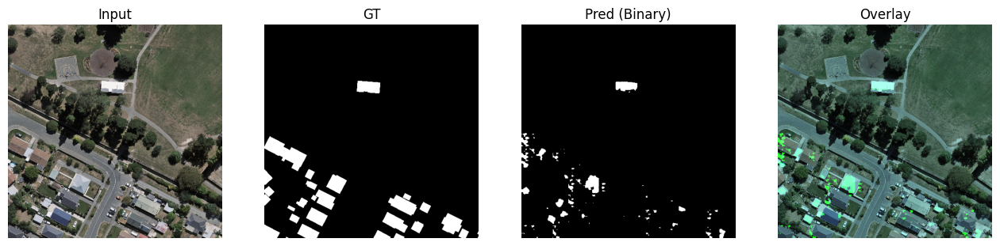

Epoch 3/30: 100%|██████████| 72/72 [00:03<00:00, 19.06it/s]


🔥 Epoch 3 | TrainLoss=0.5118


Epoch 4/30: 100%|██████████| 72/72 [00:03<00:00, 19.00it/s]

🔥 Epoch 4 | TrainLoss=0.4505


📊 Validation mIoU = 0.5097
💾 Saved best model → seg_best.pth
📸 Visualization (best model)


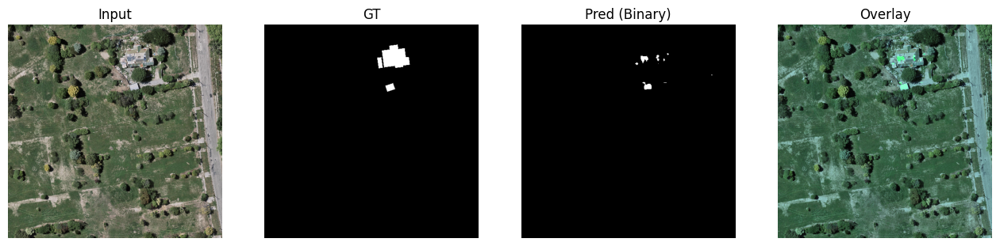

Epoch 5/30: 100%|██████████| 72/72 [00:03<00:00, 19.08it/s]


🔥 Epoch 5 | TrainLoss=0.4254


Epoch 6/30: 100%|██████████| 72/72 [00:03<00:00, 19.07it/s]

🔥 Epoch 6 | TrainLoss=0.3837


📊 Validation mIoU = 0.5487
💾 Saved best model → seg_best.pth
📸 Visualization (best model)


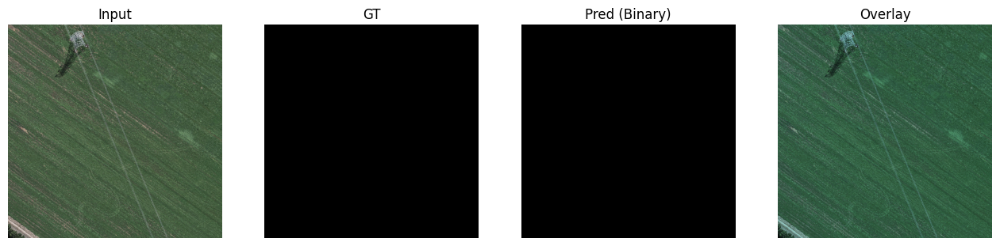

Epoch 7/30: 100%|██████████| 72/72 [00:03<00:00, 19.14it/s]


🔥 Epoch 7 | TrainLoss=0.3690


Epoch 8/30: 100%|██████████| 72/72 [00:03<00:00, 19.13it/s]

🔥 Epoch 8 | TrainLoss=0.3401


📊 Validation mIoU = 0.5751
💾 Saved best model → seg_best.pth
📸 Visualization (best model)


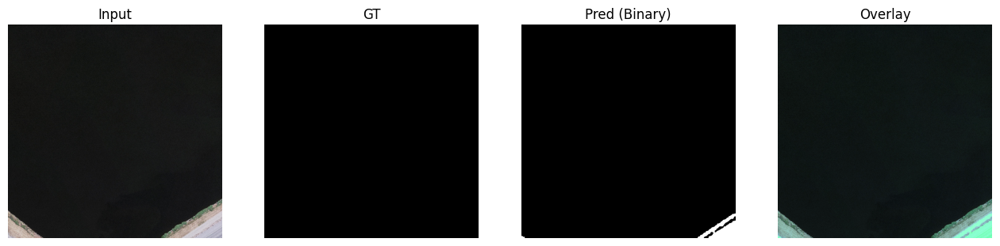

Epoch 9/30: 100%|██████████| 72/72 [00:03<00:00, 19.14it/s]


🔥 Epoch 9 | TrainLoss=0.3206


Epoch 10/30: 100%|██████████| 72/72 [00:03<00:00, 18.81it/s]

🔥 Epoch 10 | TrainLoss=0.3040


📊 Validation mIoU = 0.5709


Epoch 11/30: 100%|██████████| 72/72 [00:03<00:00, 19.08it/s]


🔥 Epoch 11 | TrainLoss=0.2898


Epoch 12/30: 100%|██████████| 72/72 [00:03<00:00, 19.13it/s]

🔥 Epoch 12 | TrainLoss=0.2765


📊 Validation mIoU = 0.5859
💾 Saved best model → seg_best.pth
📸 Visualization (best model)


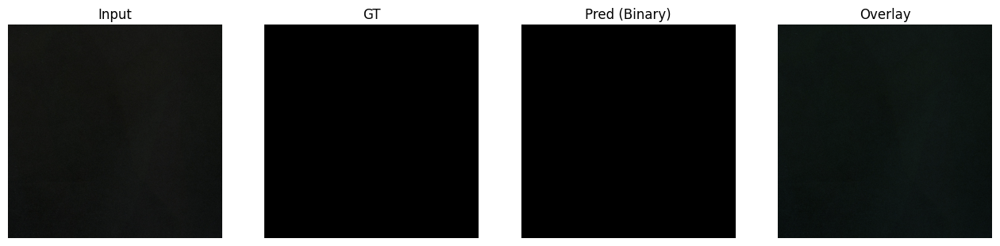

Epoch 13/30: 100%|██████████| 72/72 [00:03<00:00, 19.05it/s]


🔥 Epoch 13 | TrainLoss=0.2637


Epoch 14/30: 100%|██████████| 72/72 [00:03<00:00, 18.89it/s]

🔥 Epoch 14 | TrainLoss=0.2541


📊 Validation mIoU = 0.5975
💾 Saved best model → seg_best.pth
📸 Visualization (best model)


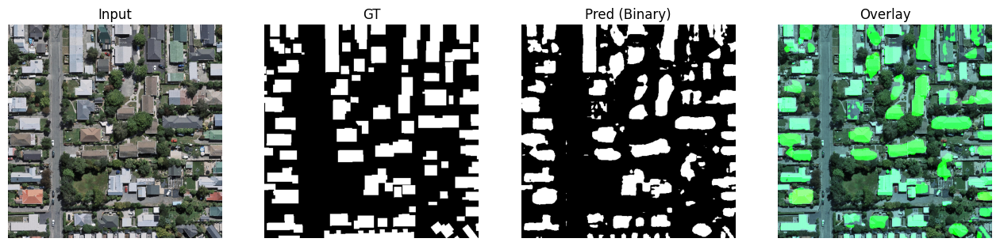

Epoch 15/30: 100%|██████████| 72/72 [00:03<00:00, 19.11it/s]


🔥 Epoch 15 | TrainLoss=0.2486


Epoch 16/30: 100%|██████████| 72/72 [00:03<00:00, 19.02it/s]

🔥 Epoch 16 | TrainLoss=0.2303


📊 Validation mIoU = 0.5945


Epoch 17/30: 100%|██████████| 72/72 [00:03<00:00, 19.16it/s]


🔥 Epoch 17 | TrainLoss=0.2289


Epoch 18/30: 100%|██████████| 72/72 [00:03<00:00, 19.17it/s]

🔥 Epoch 18 | TrainLoss=0.2273


📊 Validation mIoU = 0.5786


Epoch 19/30: 100%|██████████| 72/72 [00:03<00:00, 19.07it/s]


🔥 Epoch 19 | TrainLoss=0.2124


Epoch 20/30: 100%|██████████| 72/72 [00:03<00:00, 18.97it/s]

🔥 Epoch 20 | TrainLoss=0.2075


📊 Validation mIoU = 0.5693


Epoch 21/30: 100%|██████████| 72/72 [00:03<00:00, 18.98it/s]


🔥 Epoch 21 | TrainLoss=0.1996


Epoch 22/30: 100%|██████████| 72/72 [00:03<00:00, 19.05it/s]

🔥 Epoch 22 | TrainLoss=0.1959


📊 Validation mIoU = 0.5661


Epoch 23/30: 100%|██████████| 72/72 [00:03<00:00, 19.06it/s]


🔥 Epoch 23 | TrainLoss=0.1917


Epoch 24/30: 100%|██████████| 72/72 [00:03<00:00, 19.10it/s]

🔥 Epoch 24 | TrainLoss=0.1867


📊 Validation mIoU = 0.5699
🛑 Early stopping
🏁 GT training finished.


In [31]:
train_segmentation(
    epochs=30,
    chunk_size=8,
    labeled_fraction=0.10,
    patience=5,
    val_every=2,
    save_name="seg_best.pth"
)


In [39]:
model = EdgeUNetViT().to(device)
model.load_state_dict(torch.load("seg_best.pth"))
model.eval()

show_prediction(model, val_ds)


NameError: name 'val_ds' is not defined

In [33]:
generate_pseudo_labels(confidence=0.80)


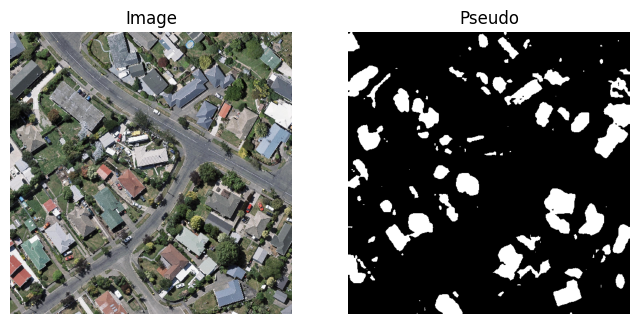

In [34]:
img = Image.open(load_images(TEST_IMG)[5])
mask = Image.open("pseudo_masks/5.png")

plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
plt.imshow(img); plt.title("Image"); plt.axis("off")
plt.subplot(1,2,2)
plt.imshow(mask, cmap="gray"); plt.title("Pseudo"); plt.axis("off")
plt.axis("off")
plt.show()


In [40]:
finetune_with_pseudo(
    epochs=15,
    chunk_size=8,
    patience=4
)


 Fine-tuning with pseudo labels (edge-safe)
 Real samples   : 5732
 Pseudo samples : 1228


Finetune 1/15: 100%|██████████| 870/870 [01:25<00:00, 10.22it/s]


 Epoch 1 | Loss=0.4287
 Saved seg_finetuned_best.pth


Finetune 2/15: 100%|██████████| 870/870 [01:24<00:00, 10.34it/s]


 Epoch 2 | Loss=0.4080
 Saved seg_finetuned_best.pth


Finetune 3/15: 100%|██████████| 870/870 [01:24<00:00, 10.33it/s]


 Epoch 3 | Loss=0.3952
 Saved seg_finetuned_best.pth


Finetune 4/15: 100%|██████████| 870/870 [01:24<00:00, 10.33it/s]


 Epoch 4 | Loss=0.3826
 Saved seg_finetuned_best.pth


Finetune 5/15: 100%|██████████| 870/870 [01:24<00:00, 10.34it/s]


 Epoch 5 | Loss=0.3665
 Saved seg_finetuned_best.pth


Finetune 6/15: 100%|██████████| 870/870 [01:24<00:00, 10.33it/s]


 Epoch 6 | Loss=0.3509
 Saved seg_finetuned_best.pth


Finetune 7/15: 100%|██████████| 870/870 [01:24<00:00, 10.34it/s]


 Epoch 7 | Loss=0.3431
 Saved seg_finetuned_best.pth


Finetune 8/15: 100%|██████████| 870/870 [01:24<00:00, 10.35it/s]


 Epoch 8 | Loss=0.3344
 Saved seg_finetuned_best.pth


Finetune 9/15: 100%|██████████| 870/870 [01:24<00:00, 10.35it/s]


 Epoch 9 | Loss=0.3322
 Saved seg_finetuned_best.pth


Finetune 10/15: 100%|██████████| 870/870 [01:24<00:00, 10.35it/s]


 Epoch 10 | Loss=0.3236
 Saved seg_finetuned_best.pth


Finetune 11/15: 100%|██████████| 870/870 [01:24<00:00, 10.33it/s]


 Epoch 11 | Loss=0.3204
 Saved seg_finetuned_best.pth


Finetune 12/15: 100%|██████████| 870/870 [01:24<00:00, 10.34it/s]


 Epoch 12 | Loss=0.3169
 Saved seg_finetuned_best.pth


Finetune 13/15: 100%|██████████| 870/870 [01:24<00:00, 10.34it/s]


 Epoch 13 | Loss=0.3117
 Saved seg_finetuned_best.pth


Finetune 14/15: 100%|██████████| 870/870 [01:24<00:00, 10.34it/s]


 Epoch 14 | Loss=0.3040
 Saved seg_finetuned_best.pth


Finetune 15/15: 100%|██████████| 870/870 [01:24<00:00, 10.34it/s]


 Epoch 15 | Loss=0.3007
 Saved seg_finetuned_best.pth
 Finetuning completed.


In [41]:
# =========================
# Load finetuned model
# =========================

model = EdgeUNetViT().to(device)
model.load_state_dict(
    torch.load("seg_finetuned_best.pth", map_location=device)
)
model.eval()

print(" Finetuned model loaded")


 Finetuned model loaded


In [42]:
# =========================
# Validation dataset
# =========================

val_imgs = sorted(glob.glob(VAL_IMG + "/*.png"))
val_masks = sorted(glob.glob(VAL_MASK + "/*.png"))
val_ds = WHUDataset(val_imgs, val_masks)

print(f" Validation samples: {len(val_ds)}")


 Validation samples: 1228


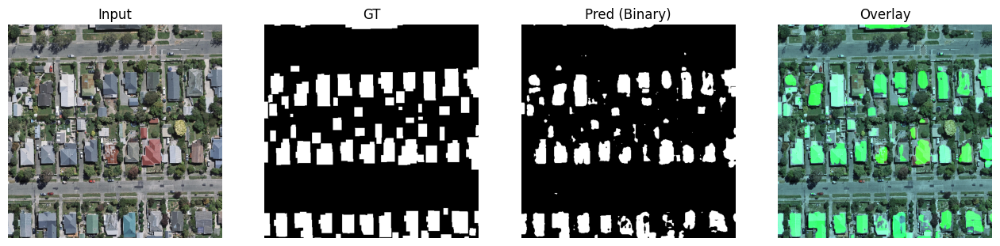

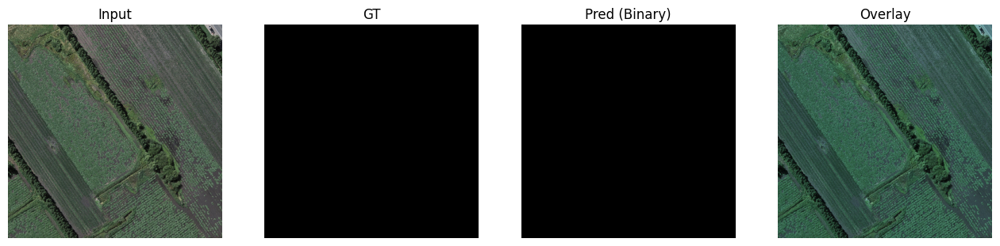

In [43]:
show_prediction(model, val_ds)
show_prediction(model, val_ds)


In [2]:
import torch
import torch.nn.functional as F
import pandas as pd
import numpy as np


In [3]:
def precision_recall_f1(pred_logits, mask, thr=0.5, eps=1e-6):
    prob = torch.sigmoid(pred_logits)
    pred = (prob > thr).float()

    tp = (pred * mask).sum()
    fp = (pred * (1 - mask)).sum()
    fn = ((1 - pred) * mask).sum()

    precision = tp / (tp + fp + eps)
    recall    = tp / (tp + fn + eps)
    f1        = 2 * precision * recall / (precision + recall + eps)

    return precision.item(), recall.item(), f1.item()


In [4]:
def boundary_f1(pred_logits, mask, thr=0.5, dilation=2, eps=1e-6):
    prob = torch.sigmoid(pred_logits)
    pred = (prob > thr).float()

    pred_edge = edge_target(pred)
    gt_edge   = edge_target(mask)

    kernel = torch.ones(
        1, 1, 2*dilation+1, 2*dilation+1, device=pred.device
    )

    pred_d = (F.conv2d(pred_edge, kernel, padding=dilation) > 0)
    gt_d   = (F.conv2d(gt_edge, kernel, padding=dilation) > 0)

    tp = (pred_d & gt_edge.bool()).sum()
    fp = pred_edge.sum() - tp
    fn = gt_edge.sum() - tp

    precision = tp / (tp + fp + eps)
    recall    = tp / (tp + fn + eps)

    bf1 = 2 * precision * recall / (precision + recall + eps)
    return bf1.item()


In [5]:
def evaluate_model(model, dataloader):
    model.eval()

    miou_list = []
    prec_list, rec_list, f1_list = [], [], []
    bf1_list = []

    with torch.no_grad():
        for img, mask in dataloader:
            img, mask = img.to(device), mask.to(device)
            pred, _ = model(img)

            miou_list.append(compute_iou(pred, mask))

            p, r, f = precision_recall_f1(pred, mask)
            prec_list.append(p)
            rec_list.append(r)
            f1_list.append(f)

            bf1_list.append(boundary_f1(pred, mask))

    return {
        "mIoU": np.mean(miou_list),
        "Precision": np.mean(prec_list),
        "Recall": np.mean(rec_list),
        "F1": np.mean(f1_list),
        "Boundary F1": np.mean(bf1_list)
    }


In [6]:
# Validation loader
val_loader = DataLoader(val_ds, batch_size=8, shuffle=False)

results = {}

# ---- GT-only model ----
model_gt = EdgeUNetViT().to(device)
model_gt.load_state_dict(torch.load("seg_best.pth", map_location=device))
model_gt.eval()

results["GT-only (10%)"] = evaluate_model(model_gt, val_loader)

# ---- Pseudo-label finetuned model ----
model_pseudo = EdgeUNetViT().to(device)
model_pseudo.load_state_dict(torch.load("seg_finetuned_best.pth", map_location=device))
model_pseudo.eval()

results["GT + Pseudo"] = evaluate_model(model_pseudo, val_loader)

# ---- Create table ----
df_results = pd.DataFrame(results).T
display(df_results.round(4))


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

,mIoU,Precision,Recall,F1,Boundary F1
GT-only (10%),0.5975,0.8225,0.7393,0.7748,0.6048
GT + Pseudo,0.5797,0.8862,0.6685,0.7567,0.5951


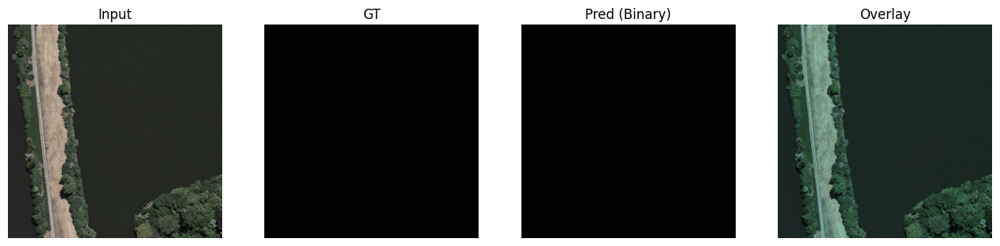

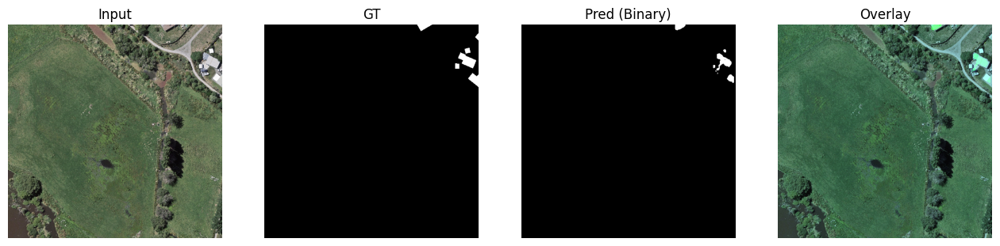

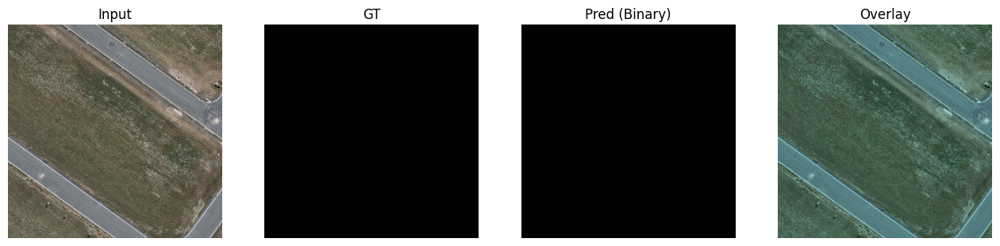

In [7]:
for _ in range(3):
    show_prediction(model_pseudo, val_ds)


In [8]:
import time

img, _ = val_ds[0]
img = img.unsqueeze(0).to(device)

start = time.time()
with torch.no_grad():
    model(img)
print("Inference time:", time.time() - start)


Inference time: 0.00476384162902832


🟢 Training (GT-only, edge + geometry aware)


Epoch 1/30: 100%|██████████| 72/72 [00:06<00:00, 11.69it/s]


🔥 Epoch 1 | TrainLoss=0.5783


Epoch 2/30: 100%|██████████| 72/72 [00:03<00:00, 19.74it/s]

🔥 Epoch 2 | TrainLoss=0.3721


📊 Validation mIoU = 0.3759
💾 Saved best model → A0_baseline.pth
📸 Visualization (best model)


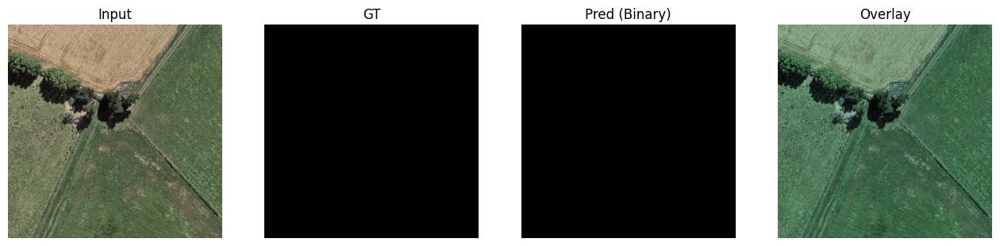

Epoch 3/30: 100%|██████████| 72/72 [00:03<00:00, 19.92it/s]


🔥 Epoch 3 | TrainLoss=0.3209


Epoch 4/30: 100%|██████████| 72/72 [00:03<00:00, 19.82it/s]

🔥 Epoch 4 | TrainLoss=0.2961


📊 Validation mIoU = 0.4674
💾 Saved best model → A0_baseline.pth
📸 Visualization (best model)


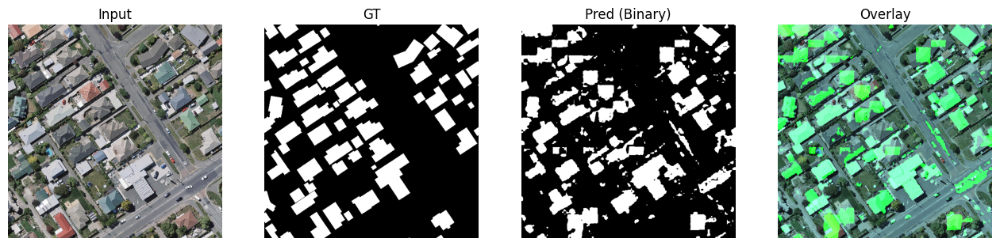

Epoch 5/30: 100%|██████████| 72/72 [00:03<00:00, 19.59it/s]


🔥 Epoch 5 | TrainLoss=0.2655


Epoch 6/30: 100%|██████████| 72/72 [00:03<00:00, 19.81it/s]

🔥 Epoch 6 | TrainLoss=0.2542


📊 Validation mIoU = 0.5286
💾 Saved best model → A0_baseline.pth
📸 Visualization (best model)


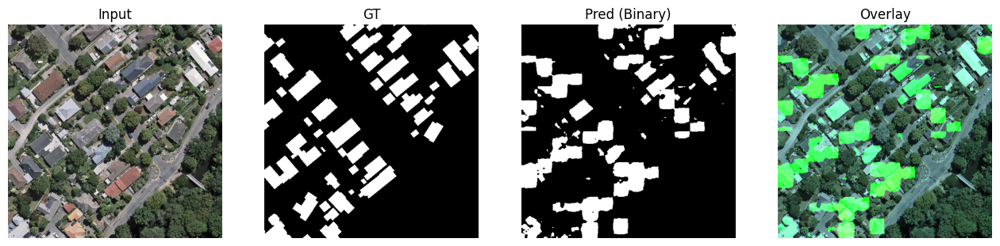

Epoch 7/30: 100%|██████████| 72/72 [00:03<00:00, 19.79it/s]


🔥 Epoch 7 | TrainLoss=0.2365


Epoch 8/30: 100%|██████████| 72/72 [00:03<00:00, 19.93it/s]

🔥 Epoch 8 | TrainLoss=0.2149


📊 Validation mIoU = 0.5252


Epoch 9/30: 100%|██████████| 72/72 [00:03<00:00, 19.80it/s]


🔥 Epoch 9 | TrainLoss=0.1980


Epoch 10/30: 100%|██████████| 72/72 [00:03<00:00, 19.90it/s]

🔥 Epoch 10 | TrainLoss=0.1819


📊 Validation mIoU = 0.5848
💾 Saved best model → A0_baseline.pth
📸 Visualization (best model)


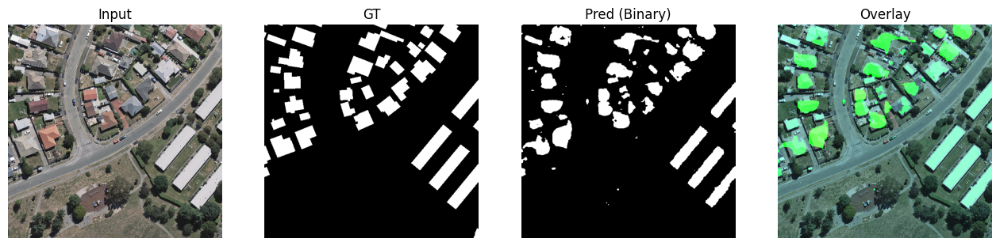

Epoch 11/30: 100%|██████████| 72/72 [00:03<00:00, 19.74it/s]


🔥 Epoch 11 | TrainLoss=0.1712


Epoch 12/30: 100%|██████████| 72/72 [00:03<00:00, 19.90it/s]

🔥 Epoch 12 | TrainLoss=0.1611


📊 Validation mIoU = 0.5828


Epoch 13/30: 100%|██████████| 72/72 [00:03<00:00, 19.77it/s]


🔥 Epoch 13 | TrainLoss=0.1572


Epoch 14/30: 100%|██████████| 72/72 [00:03<00:00, 19.90it/s]

🔥 Epoch 14 | TrainLoss=0.1492


📊 Validation mIoU = 0.5938
💾 Saved best model → A0_baseline.pth
📸 Visualization (best model)


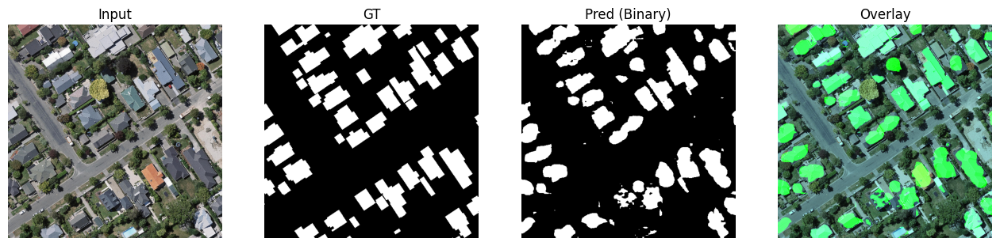

Epoch 15/30: 100%|██████████| 72/72 [00:03<00:00, 19.72it/s]


🔥 Epoch 15 | TrainLoss=0.1416


Epoch 16/30: 100%|██████████| 72/72 [00:03<00:00, 19.75it/s]

🔥 Epoch 16 | TrainLoss=0.1358


📊 Validation mIoU = 0.5805


Epoch 17/30: 100%|██████████| 72/72 [00:03<00:00, 19.83it/s]


🔥 Epoch 17 | TrainLoss=0.1393


Epoch 18/30: 100%|██████████| 72/72 [00:03<00:00, 19.90it/s]

🔥 Epoch 18 | TrainLoss=0.1219


📊 Validation mIoU = 0.6011
💾 Saved best model → A0_baseline.pth
📸 Visualization (best model)


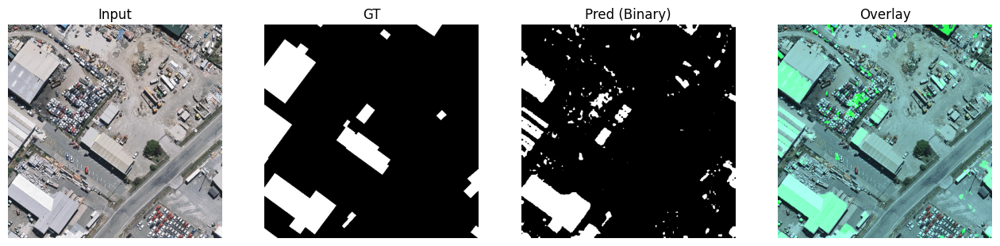

Epoch 19/30: 100%|██████████| 72/72 [00:03<00:00, 19.71it/s]


🔥 Epoch 19 | TrainLoss=0.1159


Epoch 20/30: 100%|██████████| 72/72 [00:03<00:00, 19.63it/s]

🔥 Epoch 20 | TrainLoss=0.1133


📊 Validation mIoU = 0.5968


Epoch 21/30: 100%|██████████| 72/72 [00:03<00:00, 19.95it/s]


🔥 Epoch 21 | TrainLoss=0.1104


Epoch 22/30: 100%|██████████| 72/72 [00:03<00:00, 19.83it/s]

🔥 Epoch 22 | TrainLoss=0.1060


📊 Validation mIoU = 0.6049
💾 Saved best model → A0_baseline.pth
📸 Visualization (best model)


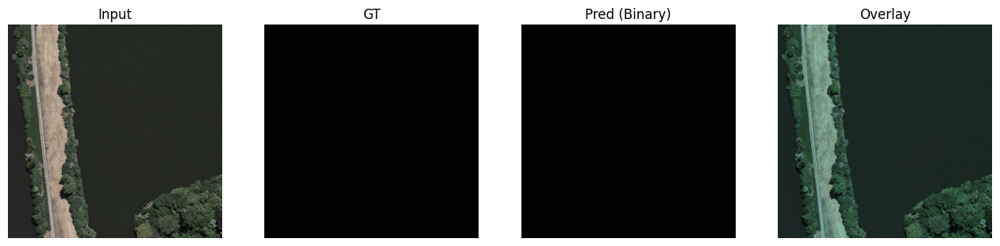

Epoch 23/30: 100%|██████████| 72/72 [00:03<00:00, 19.85it/s]


🔥 Epoch 23 | TrainLoss=0.1037


Epoch 24/30: 100%|██████████| 72/72 [00:03<00:00, 19.73it/s]

🔥 Epoch 24 | TrainLoss=0.0967


📊 Validation mIoU = 0.5990


Epoch 25/30: 100%|██████████| 72/72 [00:03<00:00, 19.93it/s]

🔥 Epoch 25 | TrainLoss=0.0962


📊 Validation mIoU = 0.5813


Epoch 26/30: 100%|██████████| 72/72 [00:03<00:00, 19.78it/s]

🔥 Epoch 26 | TrainLoss=0.0922


📊 Validation mIoU = 0.6057
💾 Saved best model → A0_baseline.pth
📸 Visualization (best model)


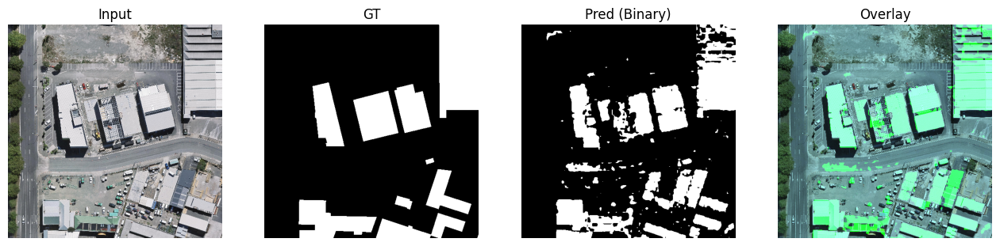

Epoch 27/30: 100%|██████████| 72/72 [00:03<00:00, 19.73it/s]

🔥 Epoch 27 | TrainLoss=0.0903


📊 Validation mIoU = 0.6047


Epoch 28/30: 100%|██████████| 72/72 [00:03<00:00, 19.79it/s]

🔥 Epoch 28 | TrainLoss=0.0896


📊 Validation mIoU = 0.6040


Epoch 29/30: 100%|██████████| 72/72 [00:03<00:00, 19.84it/s]

🔥 Epoch 29 | TrainLoss=0.0882


📊 Validation mIoU = 0.6027
🛑 Early stopping
🏁 GT training finished.


In [9]:
# =========================
# Ablation A0: Baseline
# =========================

train_segmentation(
    epochs=30,
    chunk_size=8,
    labeled_fraction=0.10,
    patience=3,
    use_edge=False,
    use_osl=False,
    use_gal=False,
    save_name="A0_baseline.pth"
)


🟢 Training (GT-only, edge + geometry aware)


Epoch 1/30: 100%|██████████| 72/72 [00:03<00:00, 18.20it/s]


🔥 Epoch 1 | TrainLoss=0.6813


Epoch 2/30: 100%|██████████| 72/72 [00:03<00:00, 18.93it/s]

🔥 Epoch 2 | TrainLoss=0.4719


📊 Validation mIoU = 0.4018
💾 Saved best model → seg_best.pth
📸 Visualization (best model)


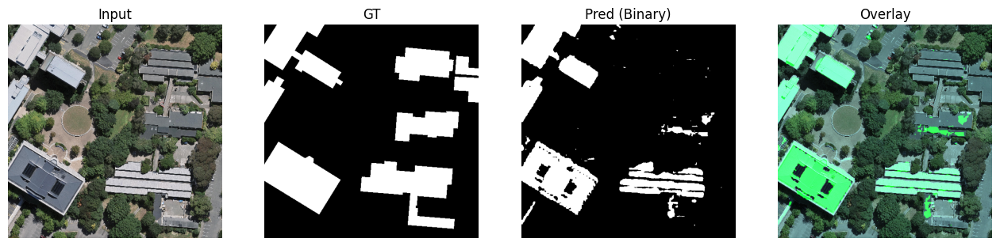

Epoch 3/30: 100%|██████████| 72/72 [00:03<00:00, 19.04it/s]


🔥 Epoch 3 | TrainLoss=0.4374


Epoch 4/30: 100%|██████████| 72/72 [00:03<00:00, 18.92it/s]

🔥 Epoch 4 | TrainLoss=0.4104


📊 Validation mIoU = 0.4789
💾 Saved best model → seg_best.pth
📸 Visualization (best model)


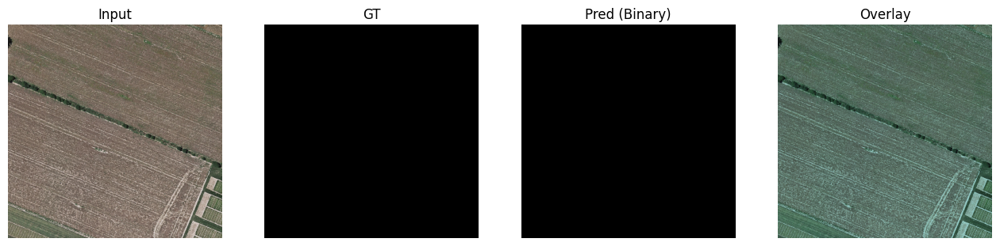

Epoch 5/30: 100%|██████████| 72/72 [00:03<00:00, 19.01it/s]


🔥 Epoch 5 | TrainLoss=0.3808


Epoch 6/30: 100%|██████████| 72/72 [00:03<00:00, 19.05it/s]

🔥 Epoch 6 | TrainLoss=0.3640


📊 Validation mIoU = 0.4934
💾 Saved best model → seg_best.pth
📸 Visualization (best model)


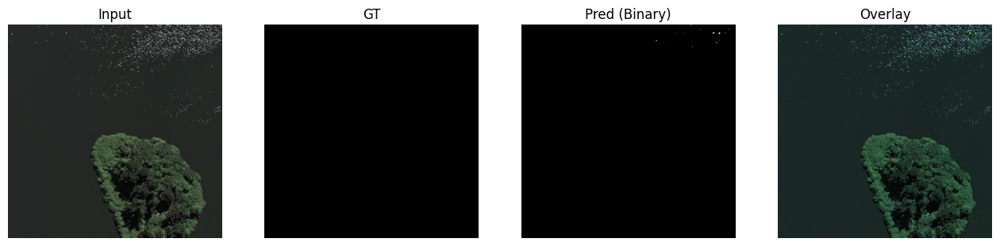

Epoch 7/30: 100%|██████████| 72/72 [00:03<00:00, 18.89it/s]


🔥 Epoch 7 | TrainLoss=0.3436


Epoch 8/30: 100%|██████████| 72/72 [00:03<00:00, 18.95it/s]

🔥 Epoch 8 | TrainLoss=0.3284


📊 Validation mIoU = 0.5154
💾 Saved best model → seg_best.pth
📸 Visualization (best model)


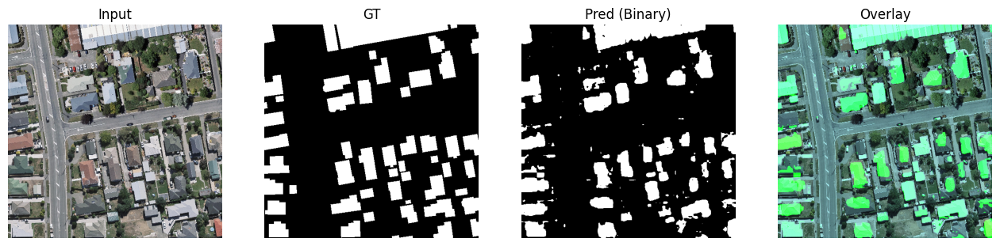

Epoch 9/30: 100%|██████████| 72/72 [00:03<00:00, 19.02it/s]


🔥 Epoch 9 | TrainLoss=0.3184


Epoch 10/30: 100%|██████████| 72/72 [00:03<00:00, 18.99it/s]

🔥 Epoch 10 | TrainLoss=0.3004


📊 Validation mIoU = 0.5385
💾 Saved best model → seg_best.pth
📸 Visualization (best model)


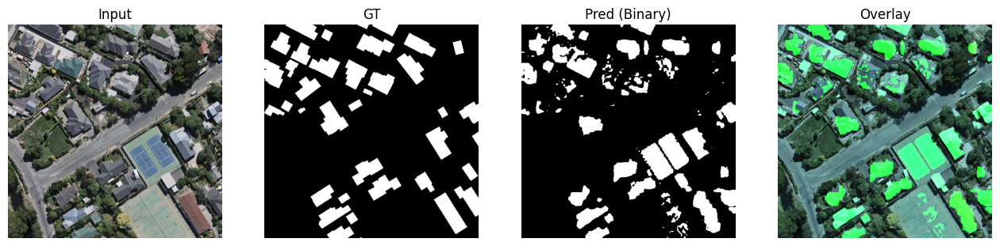

Epoch 11/30: 100%|██████████| 72/72 [00:03<00:00, 18.96it/s]


🔥 Epoch 11 | TrainLoss=0.2982


Epoch 12/30: 100%|██████████| 72/72 [00:03<00:00, 19.12it/s]

🔥 Epoch 12 | TrainLoss=0.2862


📊 Validation mIoU = 0.5432
💾 Saved best model → seg_best.pth
📸 Visualization (best model)


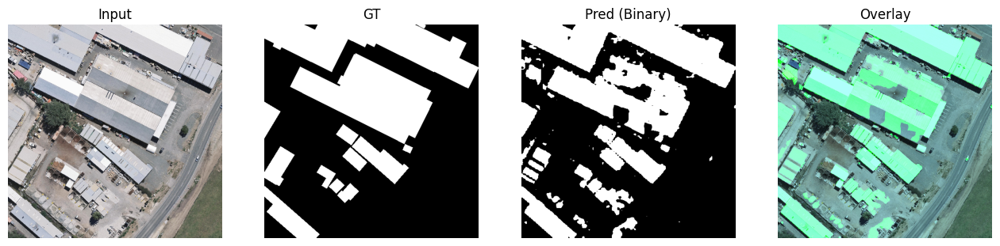

Epoch 13/30: 100%|██████████| 72/72 [00:03<00:00, 18.96it/s]


🔥 Epoch 13 | TrainLoss=0.2645


Epoch 14/30: 100%|██████████| 72/72 [00:03<00:00, 19.07it/s]

🔥 Epoch 14 | TrainLoss=0.2589


📊 Validation mIoU = 0.5761
💾 Saved best model → seg_best.pth
📸 Visualization (best model)


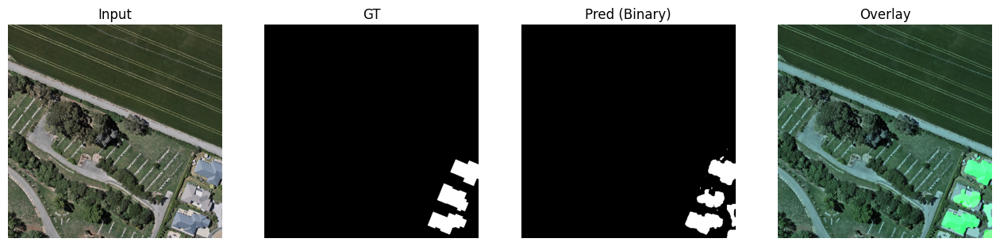

Epoch 15/30: 100%|██████████| 72/72 [00:03<00:00, 19.13it/s]


🔥 Epoch 15 | TrainLoss=0.2455


Epoch 16/30: 100%|██████████| 72/72 [00:03<00:00, 19.07it/s]

🔥 Epoch 16 | TrainLoss=0.2365


📊 Validation mIoU = 0.5797
💾 Saved best model → seg_best.pth
📸 Visualization (best model)


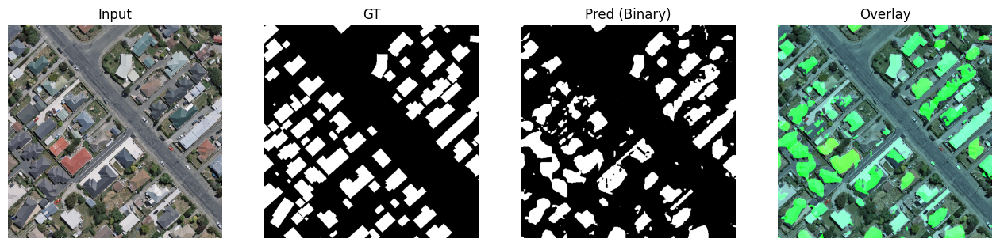

Epoch 17/30: 100%|██████████| 72/72 [00:03<00:00, 19.18it/s]


🔥 Epoch 17 | TrainLoss=0.2233


Epoch 18/30: 100%|██████████| 72/72 [00:03<00:00, 19.06it/s]

🔥 Epoch 18 | TrainLoss=0.2132


📊 Validation mIoU = 0.5802
💾 Saved best model → seg_best.pth
📸 Visualization (best model)


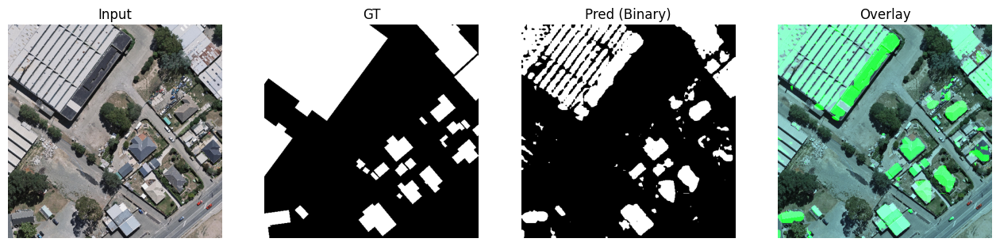

Epoch 19/30: 100%|██████████| 72/72 [00:03<00:00, 19.03it/s]


🔥 Epoch 19 | TrainLoss=0.2076


Epoch 20/30: 100%|██████████| 72/72 [00:03<00:00, 19.02it/s]

🔥 Epoch 20 | TrainLoss=0.2037


📊 Validation mIoU = 0.5590


Epoch 21/30: 100%|██████████| 72/72 [00:03<00:00, 19.19it/s]


🔥 Epoch 21 | TrainLoss=0.1974


Epoch 22/30: 100%|██████████| 72/72 [00:03<00:00, 19.05it/s]

🔥 Epoch 22 | TrainLoss=0.1932


📊 Validation mIoU = 0.5615


Epoch 23/30: 100%|██████████| 72/72 [00:03<00:00, 19.10it/s]


🔥 Epoch 23 | TrainLoss=0.1896


Epoch 24/30: 100%|██████████| 72/72 [00:03<00:00, 19.01it/s]

🔥 Epoch 24 | TrainLoss=0.1861


📊 Validation mIoU = 0.5113


Epoch 25/30: 100%|██████████| 72/72 [00:03<00:00, 19.15it/s]

🔥 Epoch 25 | TrainLoss=0.1819


📊 Validation mIoU = 0.5699


Epoch 26/30: 100%|██████████| 72/72 [00:03<00:00, 18.96it/s]

🔥 Epoch 26 | TrainLoss=0.1791


📊 Validation mIoU = 0.5761
🛑 Early stopping
🏁 GT training finished.


In [11]:
# =========================
# Full GT Model (A3)
# =========================

train_segmentation(
    epochs=30,
    chunk_size=8,
    labeled_fraction=0.10,
    patience=5,
    val_every=2,
    save_name="seg_best.pth"
)


In [12]:
# =========================
# Pseudo-label Stage
# =========================

generate_pseudo_labels(confidence=0.80)

finetune_with_pseudo(
    epochs=15,
    chunk_size=8,
    patience=4
)


 Fine-tuning with pseudo labels (edge-safe)
 Real samples   : 5732
 Pseudo samples : 1228


Finetune 1/15: 100%|██████████| 870/870 [01:24<00:00, 10.29it/s]


 Epoch 1 | Loss=0.4094
 Saved seg_finetuned_best.pth


Finetune 2/15: 100%|██████████| 870/870 [01:23<00:00, 10.37it/s]


 Epoch 2 | Loss=0.3914
 Saved seg_finetuned_best.pth


Finetune 3/15: 100%|██████████| 870/870 [01:26<00:00, 10.00it/s]


 Epoch 3 | Loss=0.3785
 Saved seg_finetuned_best.pth


Finetune 4/15: 100%|██████████| 870/870 [01:24<00:00, 10.34it/s]


 Epoch 4 | Loss=0.3623
 Saved seg_finetuned_best.pth


Finetune 5/15: 100%|██████████| 870/870 [01:24<00:00, 10.27it/s]


 Epoch 5 | Loss=0.3405
 Saved seg_finetuned_best.pth


Finetune 6/15: 100%|██████████| 870/870 [01:24<00:00, 10.28it/s]


 Epoch 6 | Loss=0.3303
 Saved seg_finetuned_best.pth


Finetune 7/15: 100%|██████████| 870/870 [01:24<00:00, 10.28it/s]


 Epoch 7 | Loss=0.3182
 Saved seg_finetuned_best.pth


Finetune 8/15: 100%|██████████| 870/870 [01:23<00:00, 10.39it/s]


 Epoch 8 | Loss=0.3170
 Saved seg_finetuned_best.pth


Finetune 9/15: 100%|██████████| 870/870 [01:24<00:00, 10.28it/s]


 Epoch 9 | Loss=0.3104
 Saved seg_finetuned_best.pth


Finetune 10/15: 100%|██████████| 870/870 [01:24<00:00, 10.34it/s]


 Epoch 10 | Loss=0.3077
 Saved seg_finetuned_best.pth


Finetune 11/15: 100%|██████████| 870/870 [01:23<00:00, 10.37it/s]


 Epoch 11 | Loss=0.3033
 Saved seg_finetuned_best.pth


Finetune 12/15: 100%|██████████| 870/870 [01:24<00:00, 10.29it/s]


 Epoch 12 | Loss=0.2981
 Saved seg_finetuned_best.pth


Finetune 13/15: 100%|██████████| 870/870 [01:24<00:00, 10.29it/s]


 Epoch 13 | Loss=0.2940
 Saved seg_finetuned_best.pth


Finetune 14/15: 100%|██████████| 870/870 [01:24<00:00, 10.35it/s]


 Epoch 14 | Loss=0.2898
 Saved seg_finetuned_best.pth


Finetune 15/15: 100%|██████████| 870/870 [01:24<00:00, 10.29it/s]


 Epoch 15 | Loss=0.2830
 Saved seg_finetuned_best.pth
 Finetuning completed.


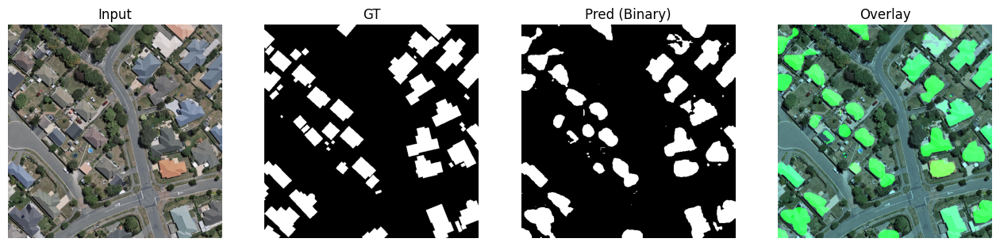

In [3]:
# =========================
# Final Evaluation
# =========================

model = EdgeUNetViT().to(device)
model.load_state_dict(torch.load("seg_finetuned_best.pth", map_location=device))
model.eval()

show_prediction(model, val_ds)


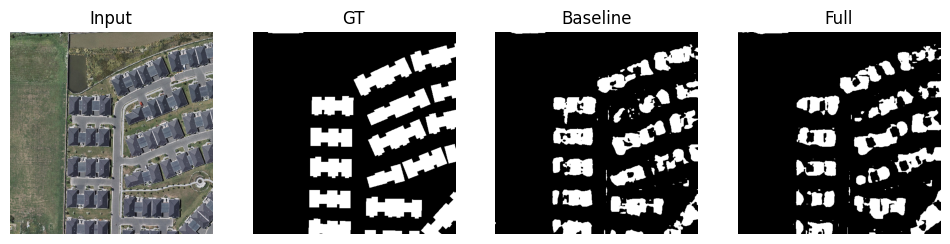

In [14]:
models = {
    "Baseline": "A0_baseline.pth",
    "Full": "seg_best.pth"
}

idx = 0
plt.figure(figsize=(12,4))

plt.subplot(1,4,1)
plt.title("Input")
plt.imshow(val_ds[idx][0].permute(1,2,0))
plt.axis("off")

plt.subplot(1,4,2)
plt.title("GT")
plt.imshow(val_ds[idx][1][0], cmap="gray")
plt.axis("off")

i = 3
for name, ckpt in models.items():
    model = EdgeUNetViT().to(device)
    model.load_state_dict(torch.load(ckpt, map_location=device))
    model.eval()

    with torch.no_grad():
        pred, _ = model(val_ds[idx][0].unsqueeze(0).to(device))
        pred_bin = (torch.sigmoid(pred)[0,0] > 0.5).cpu().numpy()

    plt.subplot(1,4,i)
    plt.title(name)
    plt.imshow(pred_bin, cmap="gray")
    plt.axis("off")
    i += 1

plt.show()


In [17]:
def train_segmentation_fast(
    epochs=30,
    chunk_size=8,
    labeled_fraction=0.10,
    use_edge=True,
    use_gal=True,
    use_osl=True,
    save_name="seg_fast.pth"
):
    print("⚡ Fast Training Mode (epoch-only, no validation)")

    # =======================
    # Losses
    # =======================
    bce = nn.BCEWithLogitsLoss()

    class TverskyLoss(nn.Module):
        def __init__(self, alpha=0.55, beta=0.45, eps=1e-6):
            super().__init__()
            self.alpha = alpha
            self.beta = beta
            self.eps = eps

        def forward(self, logits, target):
            prob = torch.sigmoid(logits)
            tp = (prob * target).sum()
            fp = (prob * (1 - target)).sum()
            fn = ((1 - prob) * target).sum()
            return 1 - (tp + self.eps) / (
                tp + self.alpha * fp + self.beta * fn + self.eps
            )

    tversky = TverskyLoss()

    def interior_loss(pred, mask):
        prob = torch.sigmoid(pred)
        interior = F.avg_pool2d(mask, 7, 1, 3)
        interior = (interior > 0.9).float()
        return ((1 - prob) * interior).mean()

    def background_suppression_loss(pred, mask):
        prob = torch.sigmoid(pred)
        return ((prob ** 2) * (1 - mask)).mean()

    def gal_loss(pred, mask):
        prob = torch.sigmoid(pred)
        return (
            (prob.mean(dim=3) - mask.mean(dim=3)).abs().mean() +
            (prob.mean(dim=2) - mask.mean(dim=2)).abs().mean()
        )

    # =======================
    # Dataset (MINIMAL)
    # =======================
    all_imgs = sorted(glob.glob(TRAIN_IMG + "/*.png"))
    all_masks = sorted(glob.glob(TRAIN_MASK + "/*.png"))

    k = max(1, int(len(all_imgs) * labeled_fraction))
    train_ds = WHUDataset(all_imgs[:k], all_masks[:k])

    train_loader = DataLoader(
        train_ds,
        batch_size=chunk_size,
        shuffle=True,
        num_workers=4,
        pin_memory=True,
        persistent_workers=True,
        prefetch_factor=2
    )

    # =======================
    # Model
    # =======================
    model = EdgeUNetViT().to(device)

    if os.path.exists("vit_encoder_pretrained.pth"):
        model.encoder.load_state_dict(
            torch.load("vit_encoder_pretrained.pth", map_location=device)
        )

    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4)

    # =======================
    # Training Loop (FAST)
    # =======================
    for ep in range(1, epochs + 1):
        model.train()
        total_loss = 0.0

        for img, mask in train_loader:
            img, mask = img.to(device), mask.to(device)

            pred, edge_feat = model(img)

            loss = 0.5 * bce(pred, mask) + 0.5 * tversky(pred, mask)
            loss += 0.1 * interior_loss(pred, mask)

            if use_edge:
                loss += 0.2 * bce(edge_feat, edge_target(mask))

            if use_osl:
                loss += 0.1 * background_suppression_loss(pred, mask)

            if use_gal:
                loss += 0.1 * gal_loss(pred, mask)

            optimizer.zero_grad(set_to_none=True)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        print(f"⚡ Epoch {ep}/{epochs} | Loss={total_loss/len(train_loader):.4f}")

    torch.save(model.state_dict(), save_name)
    print(f"💾 Saved final model → {save_name}")
    print("🏁 Fast training finished.")


In [21]:
# =========================
# Run Ablation Study
# =========================

ablation_results = {}

for name, cfg in ABLATIONS.items():
    print(f"\n🧪 Running ablation: {name}")

    train_segmentation_fast(
        epochs=30,                     # short, controlled
        chunk_size=8,
        labeled_fraction=0.10,
        # patience=2,
        # val_every=0,                  # no spam
        use_edge=cfg["edge"],
        use_osl=cfg["osl"],
        use_gal=cfg["gal"],
        save_name=f"{name}.pth"
    )

    # Load best model
    model = EdgeUNetViT().to(device)
    model.load_state_dict(torch.load(f"{name}.pth", map_location=device))
    model.eval()

    # Validation IoU
    ious = []
    with torch.no_grad():
        for img, mask in val_loader:
            img, mask = img.to(device), mask.to(device)
            pred, _ = model(img)
            ious.append(compute_iou(pred, mask))

    ablation_results[name] = np.mean(ious)
    print(f" {name} mIoU = {ablation_results[name]:.4f}")



🧪 Running ablation: A0_baseline
⚡ Fast Training Mode (epoch-only, no validation)
⚡ Epoch 1/30 | Loss=0.6215
⚡ Epoch 2/30 | Loss=0.4137
⚡ Epoch 3/30 | Loss=0.3300
⚡ Epoch 4/30 | Loss=0.2909
⚡ Epoch 5/30 | Loss=0.2679
⚡ Epoch 6/30 | Loss=0.2460
⚡ Epoch 7/30 | Loss=0.2211
⚡ Epoch 8/30 | Loss=0.1980
⚡ Epoch 9/30 | Loss=0.1816
⚡ Epoch 10/30 | Loss=0.1672
⚡ Epoch 11/30 | Loss=0.1573
⚡ Epoch 12/30 | Loss=0.1486
⚡ Epoch 13/30 | Loss=0.1381
⚡ Epoch 14/30 | Loss=0.1345
⚡ Epoch 15/30 | Loss=0.1285
⚡ Epoch 16/30 | Loss=0.1232
⚡ Epoch 17/30 | Loss=0.1216
⚡ Epoch 18/30 | Loss=0.1114
⚡ Epoch 19/30 | Loss=0.1083
⚡ Epoch 20/30 | Loss=0.1103
⚡ Epoch 21/30 | Loss=0.0995
⚡ Epoch 22/30 | Loss=0.1007
⚡ Epoch 23/30 | Loss=0.0931
⚡ Epoch 24/30 | Loss=0.0918
⚡ Epoch 25/30 | Loss=0.0889
⚡ Epoch 26/30 | Loss=0.0847
⚡ Epoch 27/30 | Loss=0.0847
⚡ Epoch 28/30 | Loss=0.0841
⚡ Epoch 29/30 | Loss=0.0811
⚡ Epoch 30/30 | Loss=0.0756
💾 Saved final model → A0_baseline.pth
🏁 Fast training finished.
 A0_baseline mIoU = 0.5

In [22]:
import pandas as pd

df = pd.DataFrame.from_dict(
    ablation_results, orient="index", columns=["mIoU"]
)

display(df)


,mIoU
A0_baseline,0.597365
A1_edge,0.565366
A2_edge_osl,0.530890
A3_full,0.444330


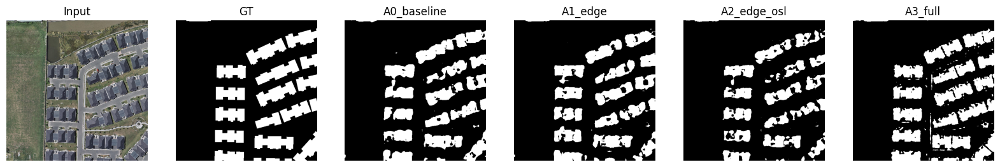

In [4]:
idx = 0  # same sample for fairness

plt.figure(figsize=(20,4))
plt.subplot(1,6,1)
plt.title("Input")
plt.imshow(val_ds[idx][0].permute(1,2,0))
plt.axis("off")

plt.subplot(1,6,2)
plt.title("GT")
plt.imshow(val_ds[idx][1][0], cmap="gray")
plt.axis("off")

for i, name in enumerate(ABLATIONS.keys(), start=3):
    model = EdgeUNetViT().to(device)
    model.load_state_dict(torch.load(f"{name}.pth", map_location=device))
    model.eval()

    with torch.no_grad():
        pred, _ = model(val_ds[idx][0].unsqueeze(0).to(device))
        pred_bin = (torch.sigmoid(pred)[0,0] > 0.5).cpu().numpy()

    plt.subplot(1,6,i)
    plt.title(name)
    plt.imshow(pred_bin, cmap="gray")
    plt.axis("off")

plt.show()
